In [0]:
import os
import numpy as np
from keras.layers import Input, Dense, Flatten, Dropout, Reshape, Concatenate, UpSampling2D
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose,MaxPooling2D,AveragePooling2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import GaussianNoise
from keras.models import Model, Sequential
from keras.optimizers import Adam, SGD
from google.colab import files
from skimage import io
from skimage.transform import resize
import PIL.Image
import matplotlib.pyplot as plt
import time
import random


In [2]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kokamykola","key":"31d6d5fd6d3e7a97204cd72d368d5a3b"}'}

In [0]:
filename = "/root/.kaggle/kaggle.json"
os.makedirs(os.path.dirname(filename), exist_ok=True)
os.rename('/content/kaggle.json', '/root/.kaggle/kaggle.json')
!chmod 600 /root/.kaggle/kaggle.json
import kaggle

In [0]:
kaggle.api.authenticate()
kaggle.api.dataset_download_files('kvpratama/pokemon-images-dataset', path='/content/', unzip=True)
import zipfile
zip_ref = zipfile.ZipFile('/content/pokemon.zip', 'r')
zip_ref.extractall('/content/')
zip_ref.close()

In [76]:
output_img_shape = (64,64,3)
def getGenerator(input_noise):

  hid = Dense(4*4*256, activation='relu')(input_noise)    
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Reshape((4, 4, 256))(hid)

  hid = Conv2DTranspose(128, 5, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  
  hid = Conv2DTranspose(64, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(32, 5, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  
                      
  hid = Conv2DTranspose(3, kernel_size=5, strides=2, padding="same")(hid)
  out = Activation("tanh")(hid)

  model = Model(inputs=input_noise, outputs=out)
  return model, out


def getDiscriminator(input_img):
  
  
  hid = GaussianNoise(0.1)(input_img)
  
  hid = Conv2D(16, kernel_size=3, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  
  hid = Conv2D(32, kernel_size=3, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  
  hid = Conv2D(64, kernel_size=3, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  #32x32x64
  hid = Conv2D(128, kernel_size=5, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  #16x16x128
  hid = Conv2D(256, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  #8x8x256
  hid = Conv2D(512, kernel_size=5, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Dropout(0.5)(hid)
  
  hid = Flatten()(hid)
  hid = Dense(256, activation='relu')(hid)
  
  out = Dense(1, activation='sigmoid')(hid)

  model = Model(inputs=input_img, outputs=out)
#   model.summary()
  return model,out

def train():
  g_optimizer = Adam(0.0002, 0.5)
  d_optimizer = Adam(0.0002, 0.5)
  gen_in = Input(shape = (100,))
  gen, gen_out = getGenerator(gen_in)
  disc_in = Input(shape = output_img_shape)
  disc,disc_out = getDiscriminator(disc_in)
  
  disc.compile(loss='binary_crossentropy',
            optimizer=d_optimizer,
            metrics=['accuracy'])
  disc.trainable = False
  x = gen([gen_in])
  gan_out = disc([x])
  GAN = Model(inputs=[gen_in], output=gan_out)
  GAN.compile(optimizer=g_optimizer, loss='binary_crossentropy')
  return GAN, gen, disc
GAN, G, D = train()




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:106: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("mo...)`


In [73]:
path = r'/content/pokemon'

def load_images(img_shape):
  
  fileNames = [f for f in sorted(os.listdir(path))]
  images = []
  for f in fileNames:
    img = PIL.Image.open(path + '/' + f)
    img = img.convert("RGBA")
    datas = img.getdata()

    newData = []
    for item in datas:
        if item[0] == 0 and item[1] == 0 and item[2] == 0 and item[3] == 0:
            newData.append((255, 255, 255, 1))
        else:
            newData.append(item)

    img.putdata(newData)
    images.append(resize(toRGB(np.array(img)), img_shape))
    
  images = np.array(images)
  return images
  
def toRGB(image):
  return image[:,:,[0,1,2]]
  
images = load_images((64,64))

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


In [0]:
batch_size = 40
half_batch = int(batch_size)
history = []
def save_samples():
  
  rows = 3
  columns = 3
  noises = np.random.normal(0,1,(rows*columns,100))
  gen_imgs = G.predict(noises)
  gen_imgs = gen_imgs * (-1)
  fig, axs = plt.subplots(rows, columns)
  count = 0
  for r in range(rows):
    for c in range(columns):
      img = gen_imgs[count,:,:,:]
      img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
      axs[r,c].imshow(img)
      axs[r,c].axis('off')
      count += 1
  today = datetime.datetime.today().strftime('%Y-%m-%d')
  fig.savefig('samples/%s/mnist_%d.png' % (today,epoch))
  plt.close()

In [0]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rotation_range=90)
datagen.fit(images)

kk = datagen.flow(images, batch_size=40)

a = 0
for X_batch in datagen.flow(images, batch_size=40):
  a = a + 1
#   print(a)
  for i in range(0, 40):
    images = np.append(images, X_batch[i].reshape(64, 64,3))
    
  if a == 20:
    break
    

images = images.reshape(-1,64,64,3)

In [0]:
def generate_noise(n_samples, noise_dim):
  X = np.random.normal(0, 1, size=(n_samples, noise_dim))
  return X

def show_samples(batchidx):
  noise = generate_noise(6,100)
  prediction = G.predict(noise)
  fig = plt.figure()
  for i in range(6):
      plt.subplot(1,6,i+1)
      img = prediction[i,:,:,:]
      img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
      plt.imshow(img) 
      plt.axis('off')
  plt.show()
  plt.close()  

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.645846, acc.: 57.50%] [G loss: 0.931655]


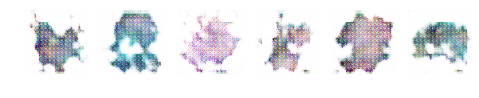

1 [D loss: 0.680064, acc.: 61.25%] [G loss: 0.914676]


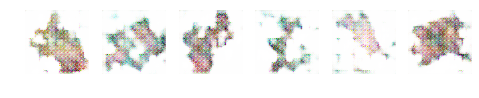

2 [D loss: 0.603955, acc.: 72.50%] [G loss: 1.102445]


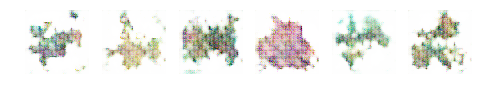

3 [D loss: 0.649884, acc.: 61.25%] [G loss: 0.847797]


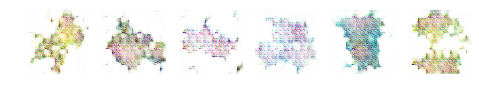

4 [D loss: 0.653615, acc.: 61.25%] [G loss: 0.850610]


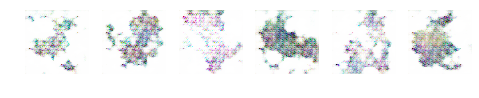

5 [D loss: 0.723168, acc.: 55.00%] [G loss: 0.946081]


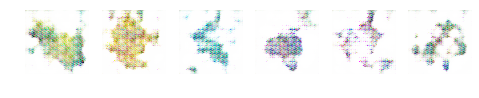

6 [D loss: 0.621421, acc.: 65.00%] [G loss: 0.960931]


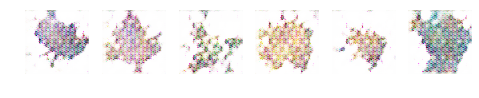

7 [D loss: 0.653336, acc.: 60.00%] [G loss: 0.861350]


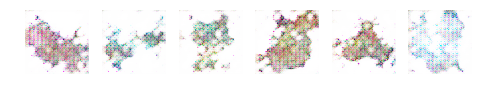

8 [D loss: 0.673746, acc.: 61.25%] [G loss: 0.767785]


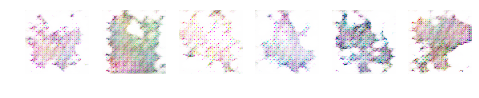

9 [D loss: 0.700019, acc.: 55.00%] [G loss: 0.883405]


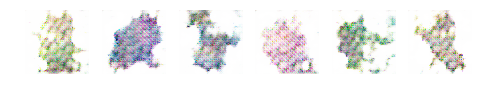

10 [D loss: 0.695153, acc.: 51.25%] [G loss: 1.027303]


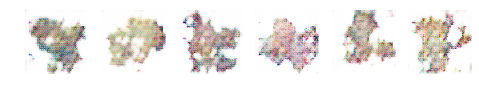

11 [D loss: 0.628567, acc.: 65.00%] [G loss: 0.883896]


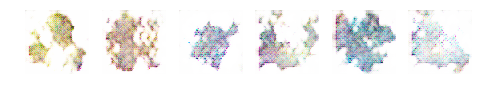

12 [D loss: 0.645067, acc.: 57.50%] [G loss: 0.980286]


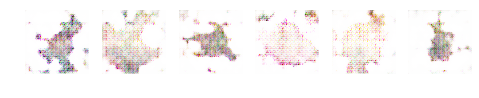

13 [D loss: 0.629252, acc.: 62.50%] [G loss: 0.900969]


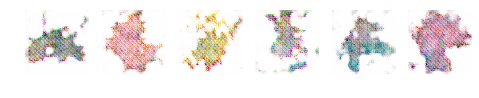

14 [D loss: 0.656483, acc.: 62.50%] [G loss: 0.939603]


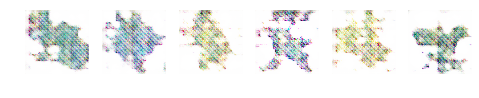

15 [D loss: 0.664690, acc.: 58.75%] [G loss: 0.958738]


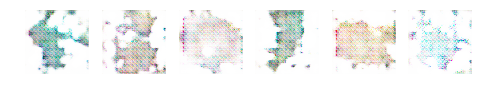

16 [D loss: 0.672599, acc.: 51.25%] [G loss: 0.932920]


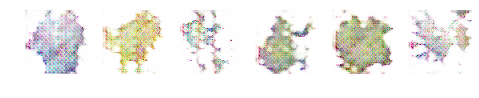

17 [D loss: 0.640058, acc.: 65.00%] [G loss: 0.958409]


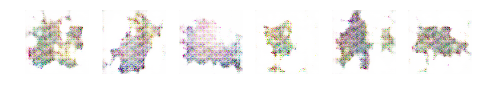

18 [D loss: 0.656064, acc.: 67.50%] [G loss: 0.801055]


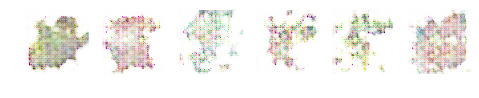

19 [D loss: 0.685290, acc.: 50.00%] [G loss: 0.805962]


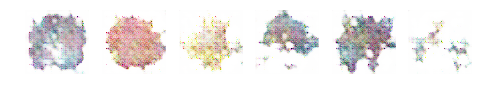

20 [D loss: 0.635648, acc.: 67.50%] [G loss: 0.869219]


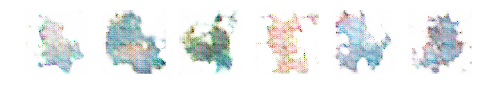

21 [D loss: 0.679918, acc.: 61.25%] [G loss: 0.866001]


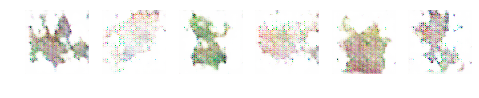

22 [D loss: 0.647740, acc.: 61.25%] [G loss: 0.792453]


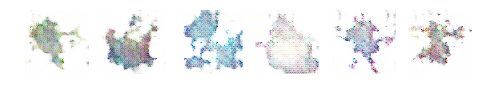

23 [D loss: 0.560227, acc.: 75.00%] [G loss: 1.028814]


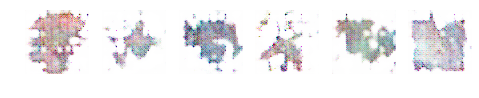

24 [D loss: 0.625547, acc.: 68.75%] [G loss: 0.857614]


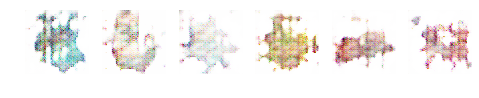

25 [D loss: 0.646078, acc.: 63.75%] [G loss: 0.770532]


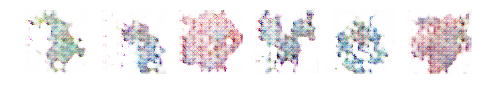

26 [D loss: 0.646655, acc.: 60.00%] [G loss: 0.833476]


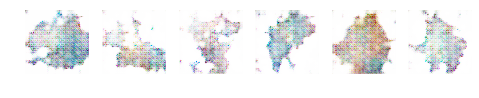

27 [D loss: 0.583910, acc.: 73.75%] [G loss: 0.881728]


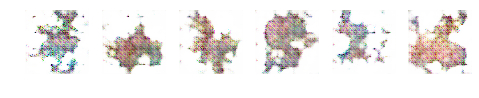

28 [D loss: 0.650010, acc.: 62.50%] [G loss: 0.902156]


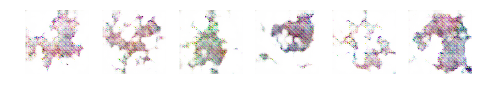

29 [D loss: 0.636226, acc.: 61.25%] [G loss: 0.871113]


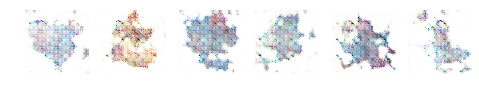

30 [D loss: 0.648083, acc.: 60.00%] [G loss: 0.788704]


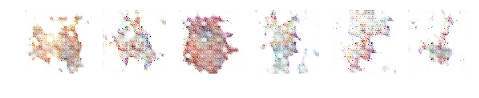

31 [D loss: 0.741396, acc.: 48.75%] [G loss: 0.765807]


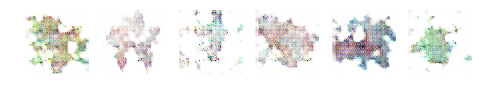

32 [D loss: 0.686717, acc.: 58.75%] [G loss: 0.901607]


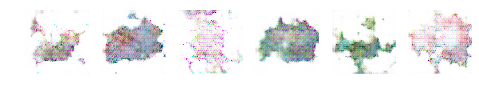

33 [D loss: 0.648558, acc.: 57.50%] [G loss: 0.901727]


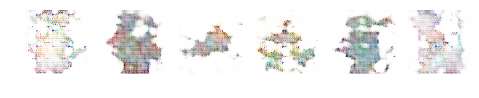

34 [D loss: 0.699756, acc.: 56.25%] [G loss: 0.823517]


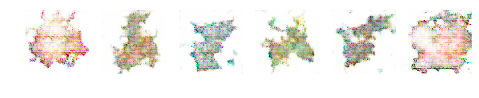

35 [D loss: 0.725902, acc.: 55.00%] [G loss: 0.961402]


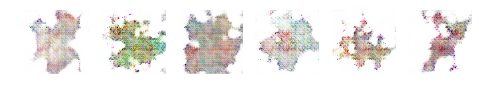

36 [D loss: 0.733715, acc.: 47.50%] [G loss: 0.890801]


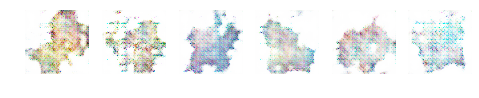

37 [D loss: 0.644674, acc.: 61.25%] [G loss: 0.861653]


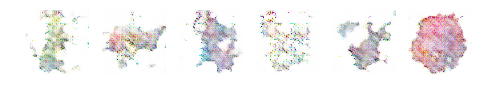

38 [D loss: 0.681636, acc.: 58.75%] [G loss: 0.898503]


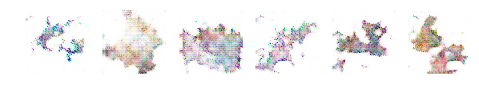

39 [D loss: 0.561762, acc.: 73.75%] [G loss: 0.855347]


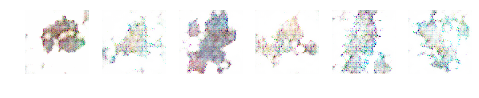

40 [D loss: 0.629249, acc.: 71.25%] [G loss: 0.975413]


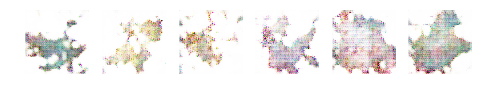

41 [D loss: 0.640736, acc.: 68.75%] [G loss: 0.972705]


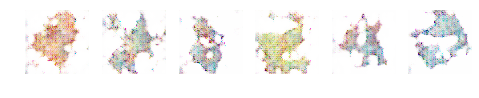

42 [D loss: 0.653340, acc.: 60.00%] [G loss: 0.818689]


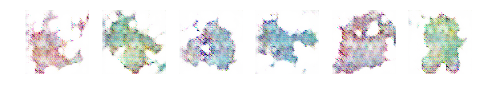

43 [D loss: 0.647192, acc.: 71.25%] [G loss: 0.897589]


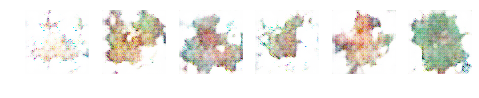

44 [D loss: 0.630115, acc.: 62.50%] [G loss: 0.903435]


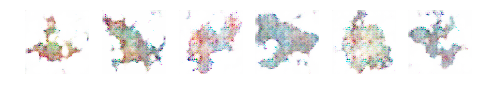

45 [D loss: 0.630960, acc.: 65.00%] [G loss: 0.888221]


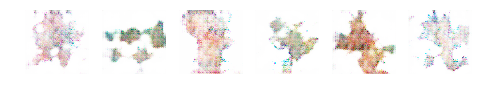

46 [D loss: 0.694723, acc.: 57.50%] [G loss: 0.905411]


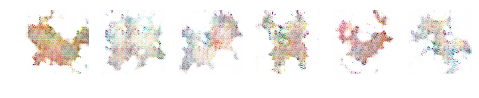

47 [D loss: 0.622227, acc.: 68.75%] [G loss: 0.924280]


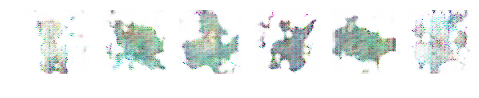

48 [D loss: 0.652212, acc.: 61.25%] [G loss: 0.912684]


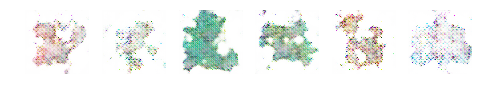

49 [D loss: 0.655425, acc.: 62.50%] [G loss: 0.912980]


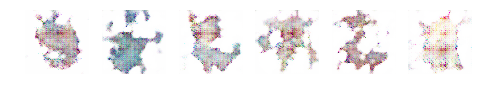

50 [D loss: 0.679988, acc.: 57.50%] [G loss: 1.004944]


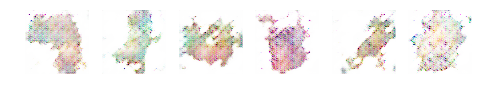

51 [D loss: 0.695697, acc.: 60.00%] [G loss: 0.883486]


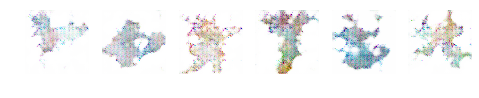

52 [D loss: 0.663213, acc.: 63.75%] [G loss: 0.823496]


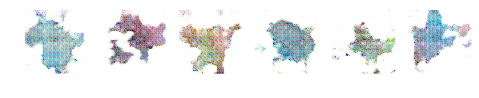

53 [D loss: 0.668036, acc.: 56.25%] [G loss: 1.050413]


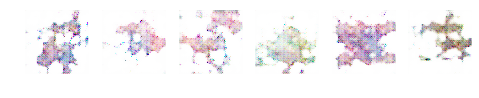

54 [D loss: 0.675668, acc.: 57.50%] [G loss: 0.833800]


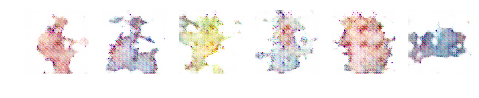

55 [D loss: 0.630323, acc.: 63.75%] [G loss: 1.024171]


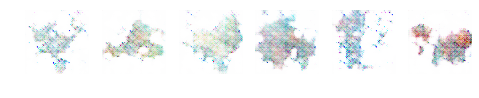

56 [D loss: 0.585457, acc.: 76.25%] [G loss: 0.851978]


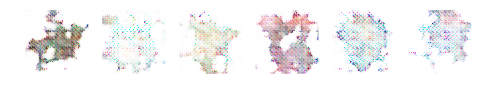

57 [D loss: 0.662788, acc.: 63.75%] [G loss: 1.003232]


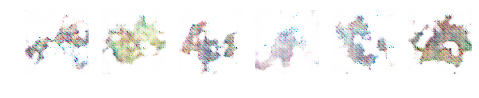

58 [D loss: 0.651625, acc.: 62.50%] [G loss: 0.803935]


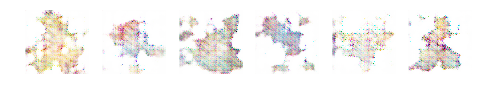

59 [D loss: 0.655174, acc.: 60.00%] [G loss: 0.892422]


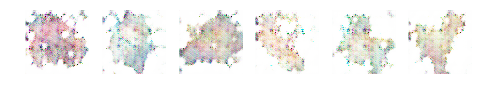

60 [D loss: 0.732882, acc.: 48.75%] [G loss: 0.984158]


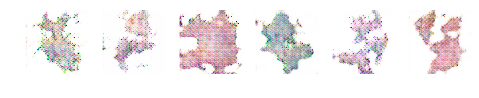

61 [D loss: 0.707032, acc.: 48.75%] [G loss: 0.979502]


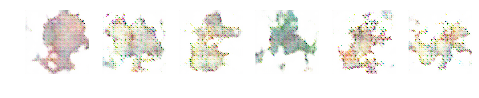

62 [D loss: 0.651698, acc.: 70.00%] [G loss: 0.954058]


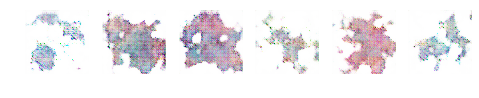

63 [D loss: 0.574690, acc.: 72.50%] [G loss: 0.885473]


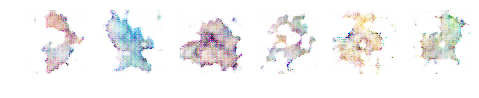

64 [D loss: 0.712718, acc.: 50.00%] [G loss: 0.828755]


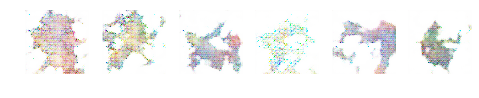

65 [D loss: 0.641861, acc.: 60.00%] [G loss: 0.868593]


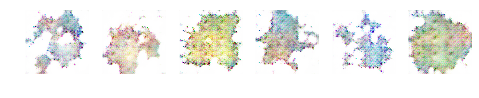

66 [D loss: 0.626703, acc.: 58.75%] [G loss: 0.756487]


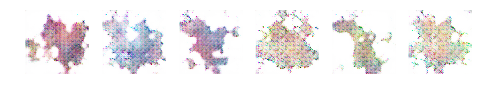

67 [D loss: 0.639915, acc.: 65.00%] [G loss: 1.122054]


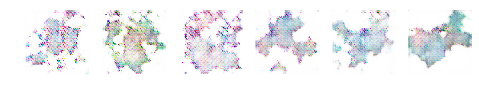

68 [D loss: 0.611257, acc.: 68.75%] [G loss: 0.816400]


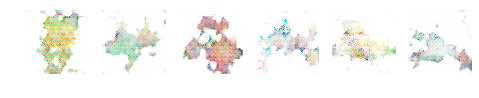

69 [D loss: 0.685873, acc.: 58.75%] [G loss: 1.085801]


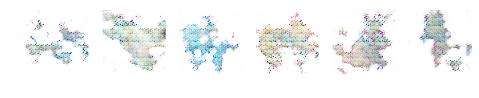

70 [D loss: 0.669043, acc.: 60.00%] [G loss: 0.995270]


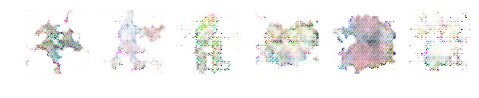

71 [D loss: 0.621916, acc.: 63.75%] [G loss: 0.892763]


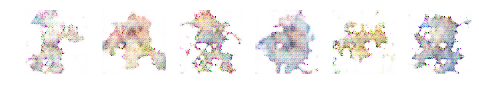

72 [D loss: 0.708316, acc.: 57.50%] [G loss: 1.096163]


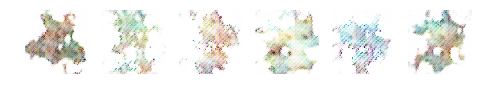

73 [D loss: 0.594827, acc.: 67.50%] [G loss: 0.980776]


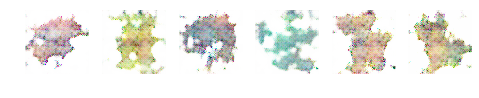

74 [D loss: 0.750081, acc.: 47.50%] [G loss: 1.057260]


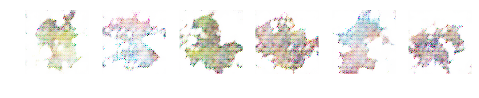

75 [D loss: 0.544853, acc.: 67.50%] [G loss: 1.181126]


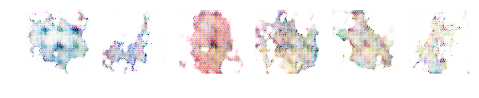

76 [D loss: 0.693641, acc.: 60.00%] [G loss: 0.946828]


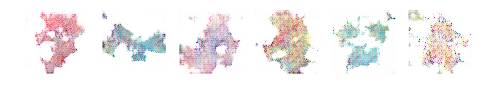

77 [D loss: 0.518233, acc.: 71.25%] [G loss: 1.015294]


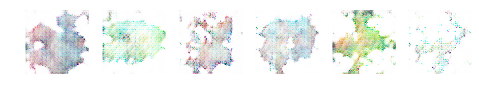

78 [D loss: 0.599908, acc.: 63.75%] [G loss: 1.082026]


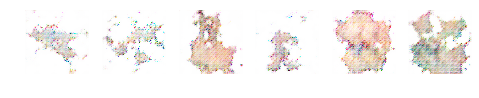

79 [D loss: 0.629679, acc.: 65.00%] [G loss: 0.921868]


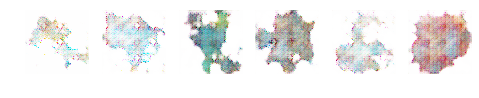

80 [D loss: 0.641313, acc.: 68.75%] [G loss: 1.006062]


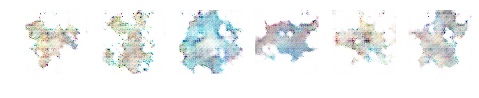

81 [D loss: 0.622637, acc.: 67.50%] [G loss: 1.069476]


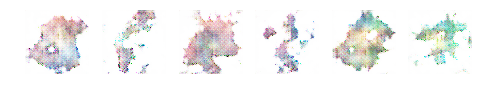

82 [D loss: 0.612451, acc.: 65.00%] [G loss: 0.931584]


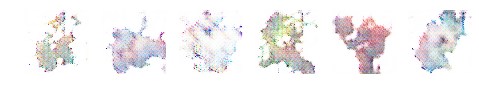

83 [D loss: 0.587985, acc.: 70.00%] [G loss: 1.027789]


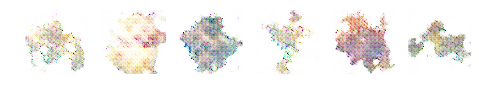

84 [D loss: 0.563405, acc.: 70.00%] [G loss: 1.003008]


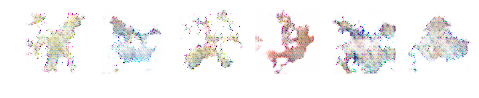

85 [D loss: 0.616090, acc.: 62.50%] [G loss: 0.801366]


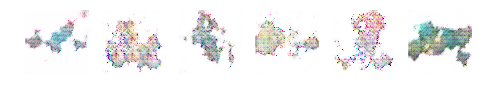

86 [D loss: 0.563391, acc.: 71.25%] [G loss: 1.042024]


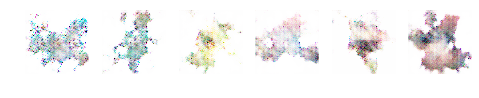

87 [D loss: 0.567320, acc.: 71.25%] [G loss: 1.051267]


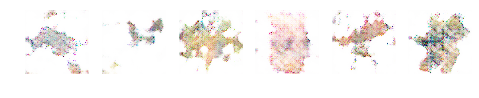

88 [D loss: 0.610552, acc.: 65.00%] [G loss: 1.110705]


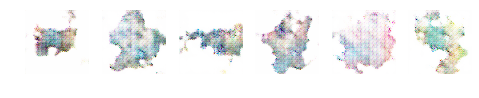

89 [D loss: 0.689337, acc.: 51.25%] [G loss: 0.861320]


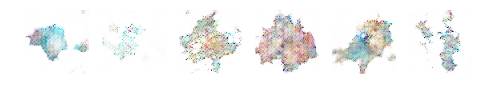

90 [D loss: 0.607465, acc.: 66.25%] [G loss: 0.994111]


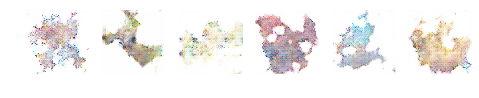

91 [D loss: 0.661888, acc.: 60.00%] [G loss: 1.235543]


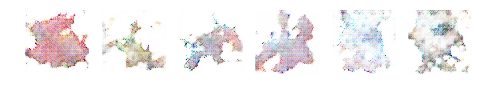

92 [D loss: 0.566657, acc.: 67.50%] [G loss: 1.018997]


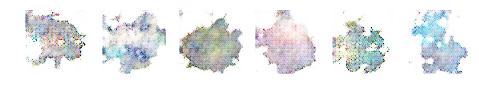

93 [D loss: 0.666596, acc.: 65.00%] [G loss: 0.920014]


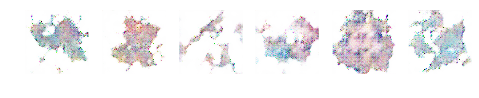

94 [D loss: 0.631673, acc.: 65.00%] [G loss: 0.960821]


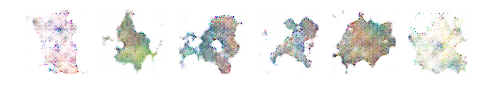

95 [D loss: 0.609203, acc.: 67.50%] [G loss: 0.937600]


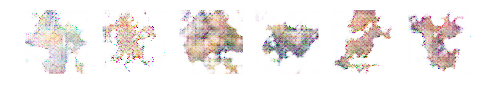

96 [D loss: 0.583949, acc.: 68.75%] [G loss: 1.038589]


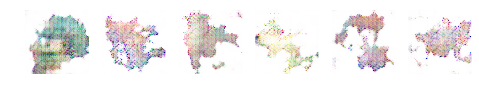

97 [D loss: 0.540909, acc.: 77.50%] [G loss: 1.026006]


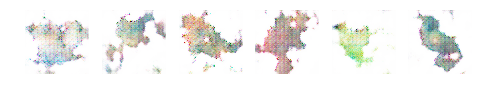

98 [D loss: 0.558589, acc.: 72.50%] [G loss: 1.066710]


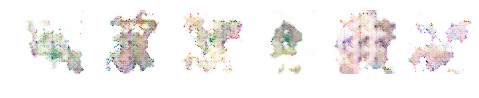

99 [D loss: 0.719207, acc.: 52.50%] [G loss: 1.158250]


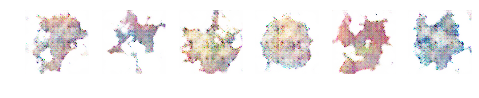

100 [D loss: 0.658096, acc.: 60.00%] [G loss: 0.999764]


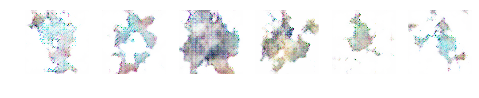

101 [D loss: 0.510973, acc.: 76.25%] [G loss: 0.922720]


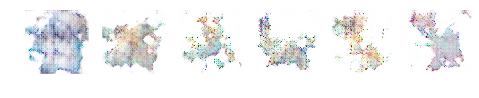

102 [D loss: 0.647763, acc.: 60.00%] [G loss: 1.046748]


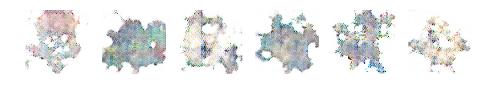

103 [D loss: 0.556269, acc.: 76.25%] [G loss: 0.954462]


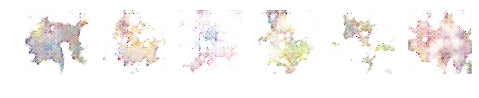

104 [D loss: 0.576421, acc.: 70.00%] [G loss: 1.014301]


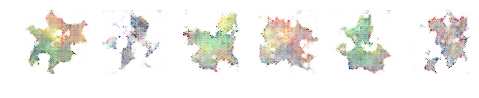

105 [D loss: 0.580724, acc.: 67.50%] [G loss: 1.090099]


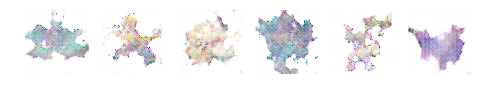

106 [D loss: 0.520680, acc.: 73.75%] [G loss: 1.044547]


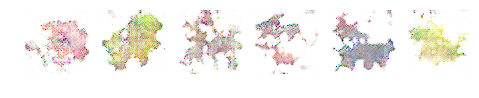

107 [D loss: 0.610507, acc.: 67.50%] [G loss: 0.962247]


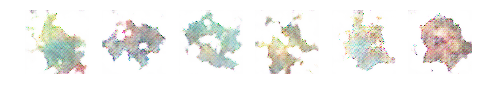

108 [D loss: 0.657515, acc.: 58.75%] [G loss: 0.957741]


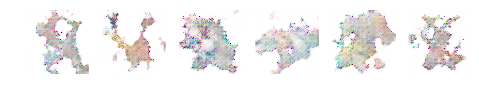

109 [D loss: 0.616450, acc.: 65.00%] [G loss: 1.167311]


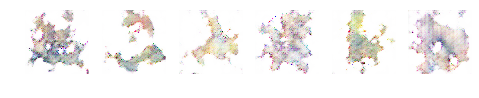

110 [D loss: 0.546482, acc.: 77.50%] [G loss: 1.056921]


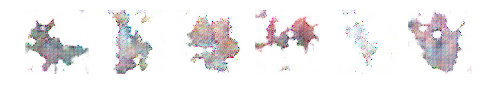

111 [D loss: 0.627118, acc.: 61.25%] [G loss: 1.069820]


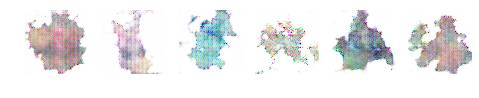

112 [D loss: 0.638053, acc.: 68.75%] [G loss: 1.001402]


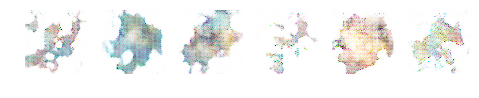

113 [D loss: 0.544729, acc.: 73.75%] [G loss: 1.005738]


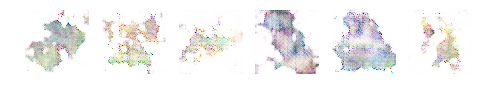

114 [D loss: 0.583902, acc.: 68.75%] [G loss: 1.030815]


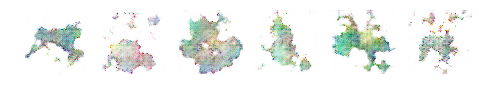

115 [D loss: 0.579103, acc.: 71.25%] [G loss: 1.072113]


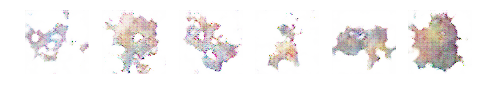

116 [D loss: 0.560280, acc.: 67.50%] [G loss: 1.084619]


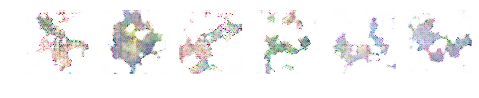

117 [D loss: 0.630934, acc.: 66.25%] [G loss: 1.118841]


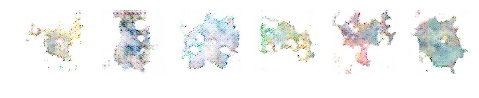

118 [D loss: 0.642465, acc.: 58.75%] [G loss: 1.080956]


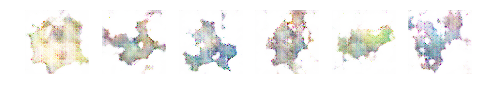

119 [D loss: 0.610126, acc.: 65.00%] [G loss: 1.196675]


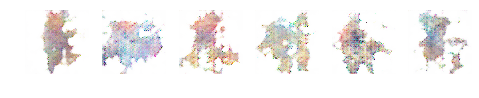

120 [D loss: 0.676779, acc.: 57.50%] [G loss: 0.887023]


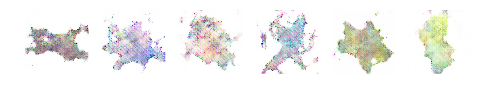

121 [D loss: 0.717387, acc.: 52.50%] [G loss: 1.006195]


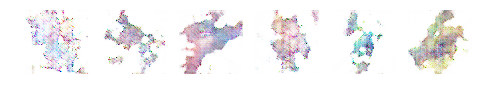

122 [D loss: 0.525152, acc.: 73.75%] [G loss: 1.148318]


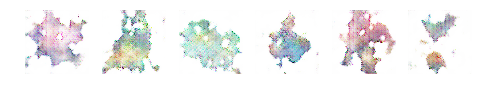

123 [D loss: 0.610599, acc.: 63.75%] [G loss: 1.181333]


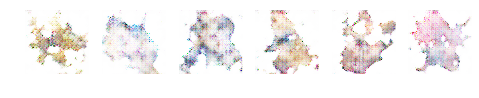

124 [D loss: 0.611534, acc.: 61.25%] [G loss: 1.203346]


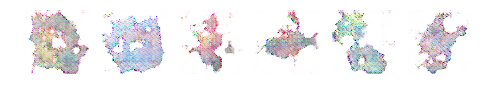

125 [D loss: 0.482237, acc.: 78.75%] [G loss: 1.120283]


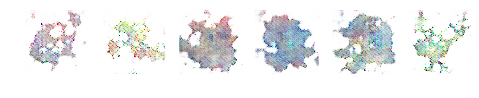

126 [D loss: 0.623705, acc.: 63.75%] [G loss: 1.146921]


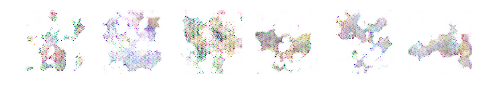

127 [D loss: 0.686147, acc.: 53.75%] [G loss: 1.117739]


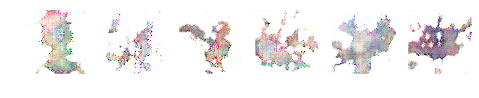

128 [D loss: 0.651530, acc.: 61.25%] [G loss: 1.128958]


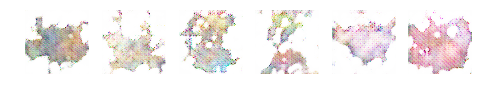

129 [D loss: 0.666990, acc.: 61.25%] [G loss: 1.250543]


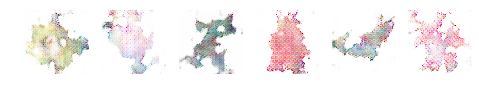

130 [D loss: 0.649596, acc.: 55.00%] [G loss: 1.112962]


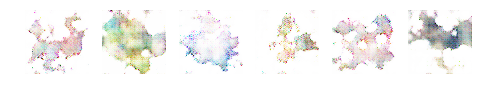

131 [D loss: 0.686778, acc.: 60.00%] [G loss: 0.960184]


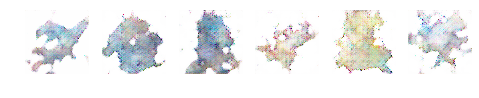

132 [D loss: 0.606260, acc.: 68.75%] [G loss: 1.144396]


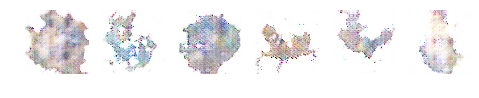

133 [D loss: 0.602839, acc.: 66.25%] [G loss: 1.026128]


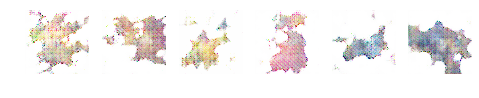

134 [D loss: 0.512990, acc.: 77.50%] [G loss: 1.083237]


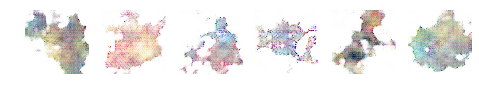

135 [D loss: 0.494946, acc.: 76.25%] [G loss: 1.110856]


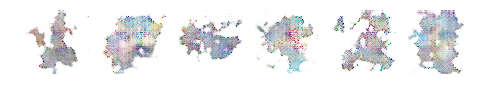

136 [D loss: 0.643009, acc.: 65.00%] [G loss: 1.062031]


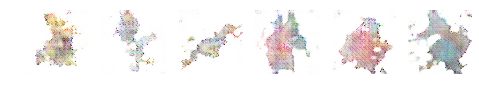

137 [D loss: 0.591017, acc.: 71.25%] [G loss: 1.106859]


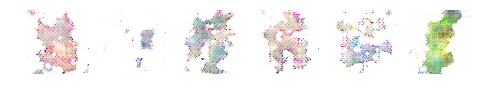

138 [D loss: 0.479819, acc.: 82.50%] [G loss: 1.056959]


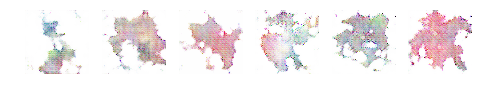

139 [D loss: 0.555272, acc.: 76.25%] [G loss: 1.098082]


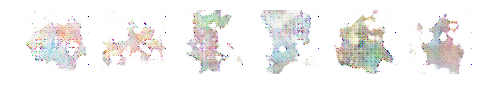

140 [D loss: 0.560120, acc.: 70.00%] [G loss: 0.992516]


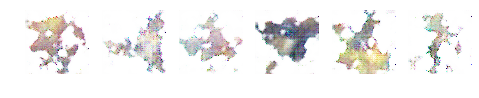

141 [D loss: 0.488418, acc.: 73.75%] [G loss: 1.078866]


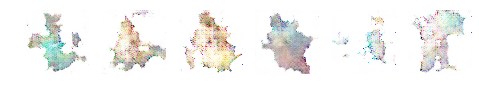

142 [D loss: 0.577100, acc.: 66.25%] [G loss: 1.149465]


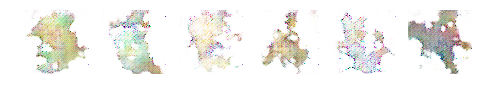

143 [D loss: 0.644257, acc.: 62.50%] [G loss: 1.102663]


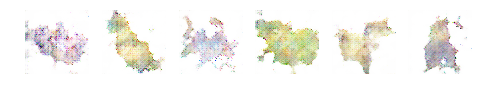

144 [D loss: 0.521053, acc.: 72.50%] [G loss: 1.142505]


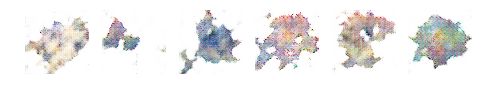

145 [D loss: 0.542059, acc.: 72.50%] [G loss: 1.196545]


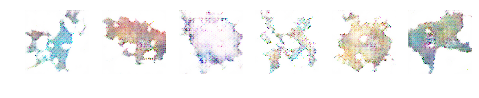

146 [D loss: 0.579424, acc.: 66.25%] [G loss: 1.121242]


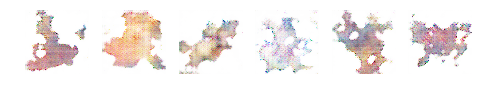

147 [D loss: 0.585467, acc.: 61.25%] [G loss: 1.229088]


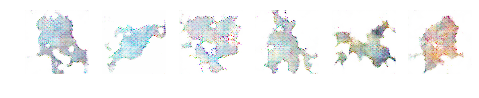

148 [D loss: 0.526241, acc.: 76.25%] [G loss: 1.499341]


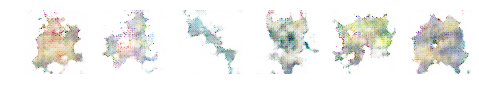

149 [D loss: 0.534856, acc.: 77.50%] [G loss: 1.293977]


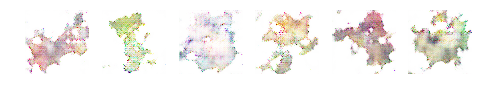

150 [D loss: 0.580925, acc.: 67.50%] [G loss: 1.224633]


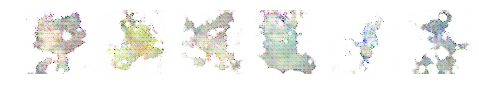

151 [D loss: 0.494897, acc.: 76.25%] [G loss: 1.202462]


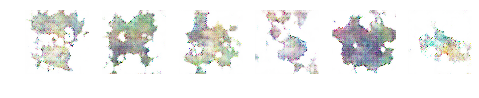

152 [D loss: 0.412060, acc.: 83.75%] [G loss: 1.262245]


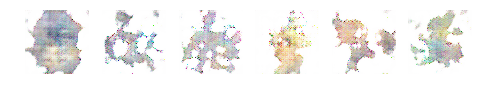

153 [D loss: 0.537101, acc.: 73.75%] [G loss: 1.245970]


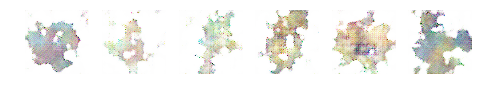

154 [D loss: 0.563250, acc.: 71.25%] [G loss: 1.486926]


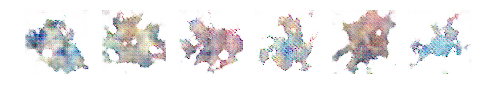

155 [D loss: 0.598983, acc.: 67.50%] [G loss: 1.383203]


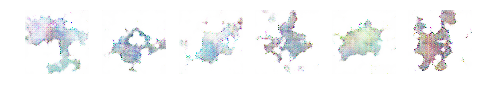

156 [D loss: 0.531529, acc.: 70.00%] [G loss: 1.344570]


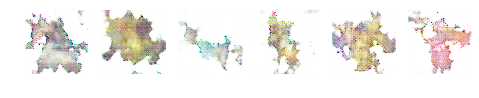

157 [D loss: 0.525850, acc.: 77.50%] [G loss: 1.133795]


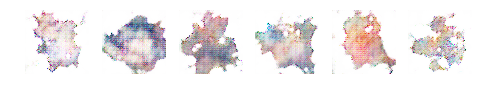

158 [D loss: 0.479004, acc.: 78.75%] [G loss: 1.381479]


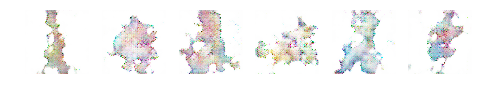

159 [D loss: 0.598954, acc.: 63.75%] [G loss: 0.965679]


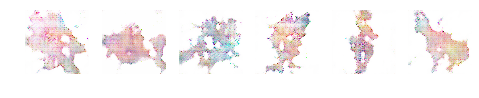

160 [D loss: 0.541291, acc.: 71.25%] [G loss: 1.191366]


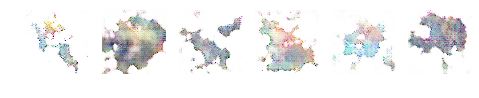

161 [D loss: 0.560424, acc.: 65.00%] [G loss: 1.331551]


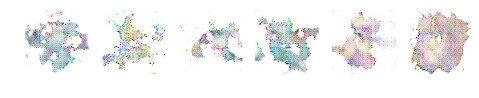

162 [D loss: 0.647559, acc.: 62.50%] [G loss: 1.255927]


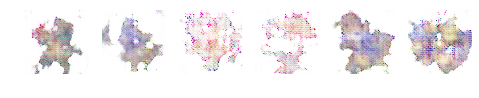

163 [D loss: 0.519747, acc.: 76.25%] [G loss: 1.158119]


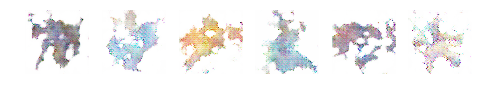

164 [D loss: 0.562943, acc.: 68.75%] [G loss: 1.032339]


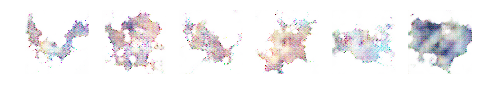

165 [D loss: 0.528305, acc.: 72.50%] [G loss: 1.328347]


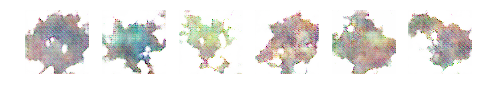

166 [D loss: 0.491308, acc.: 75.00%] [G loss: 1.414434]


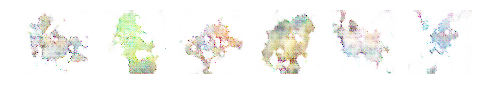

167 [D loss: 0.516714, acc.: 73.75%] [G loss: 1.494156]


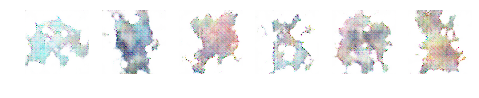

168 [D loss: 0.532828, acc.: 71.25%] [G loss: 0.944713]


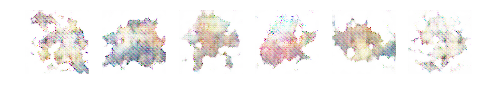

169 [D loss: 0.597928, acc.: 71.25%] [G loss: 1.351729]


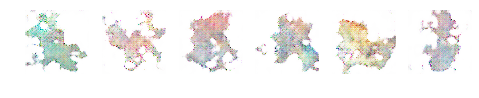

170 [D loss: 0.511483, acc.: 73.75%] [G loss: 1.258199]


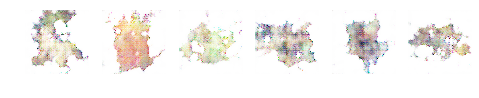

171 [D loss: 0.466307, acc.: 76.25%] [G loss: 1.527969]


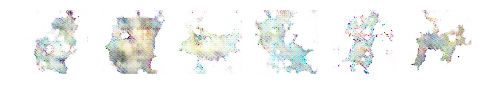

172 [D loss: 0.622216, acc.: 63.75%] [G loss: 1.296632]


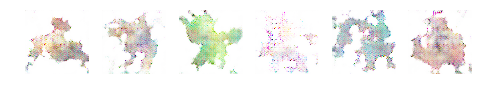

173 [D loss: 0.626344, acc.: 60.00%] [G loss: 1.370421]


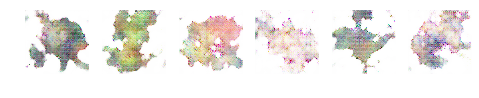

174 [D loss: 0.537491, acc.: 75.00%] [G loss: 1.413900]


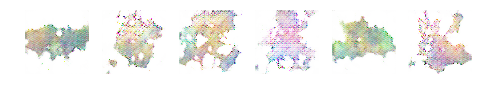

175 [D loss: 0.476052, acc.: 78.75%] [G loss: 1.379866]


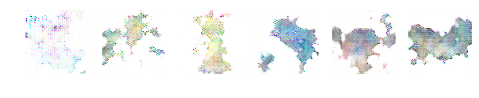

176 [D loss: 0.545211, acc.: 71.25%] [G loss: 1.293668]


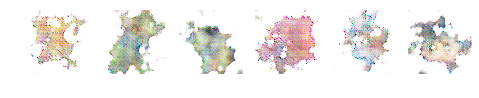

177 [D loss: 0.310017, acc.: 92.50%] [G loss: 1.564768]


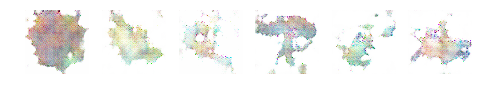

178 [D loss: 0.401116, acc.: 87.50%] [G loss: 1.299889]


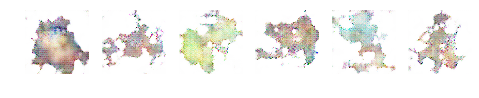

179 [D loss: 0.569236, acc.: 68.75%] [G loss: 1.456015]


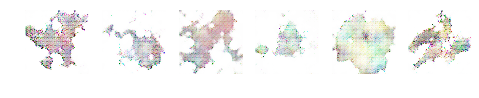

180 [D loss: 0.540698, acc.: 70.00%] [G loss: 1.254846]


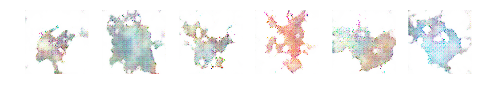

181 [D loss: 0.555874, acc.: 67.50%] [G loss: 1.525639]


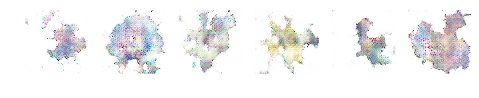

182 [D loss: 0.530696, acc.: 67.50%] [G loss: 1.484117]


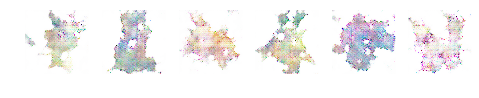

183 [D loss: 0.375403, acc.: 85.00%] [G loss: 1.474643]


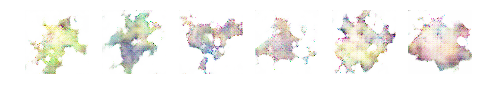

184 [D loss: 0.464450, acc.: 80.00%] [G loss: 1.392417]


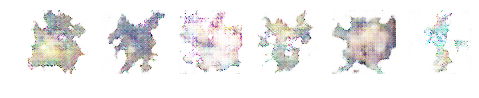

185 [D loss: 0.527600, acc.: 76.25%] [G loss: 1.488608]


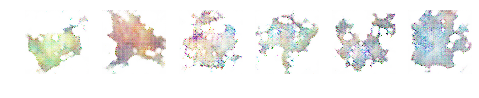

186 [D loss: 0.586679, acc.: 66.25%] [G loss: 1.425590]


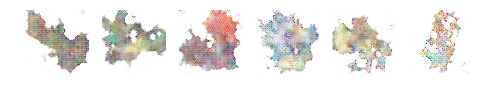

187 [D loss: 0.508135, acc.: 75.00%] [G loss: 1.236533]


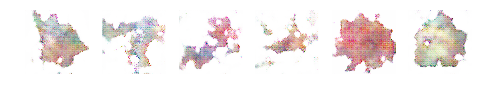

188 [D loss: 0.700036, acc.: 57.50%] [G loss: 1.774453]


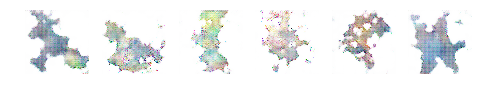

189 [D loss: 0.484708, acc.: 78.75%] [G loss: 1.978777]


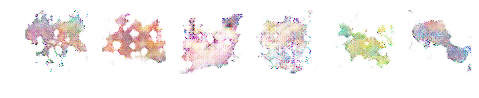

190 [D loss: 0.323915, acc.: 90.00%] [G loss: 1.670169]


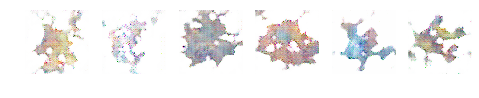

191 [D loss: 0.376545, acc.: 78.75%] [G loss: 1.859064]


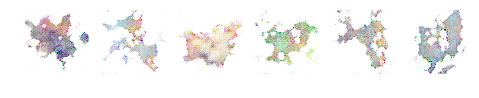

192 [D loss: 0.370573, acc.: 81.25%] [G loss: 1.752301]


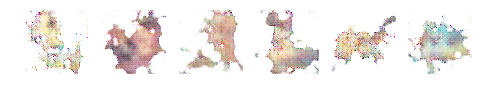

193 [D loss: 0.518239, acc.: 76.25%] [G loss: 1.236658]


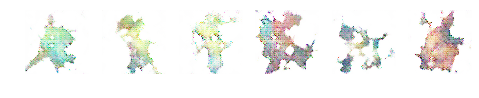

194 [D loss: 0.638677, acc.: 62.50%] [G loss: 1.459380]


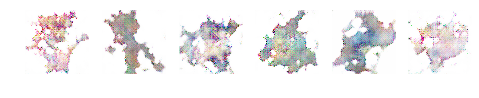

195 [D loss: 0.460285, acc.: 73.75%] [G loss: 1.640458]


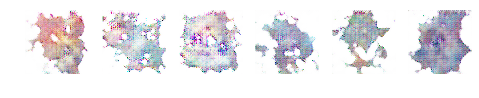

196 [D loss: 0.502942, acc.: 71.25%] [G loss: 1.495560]


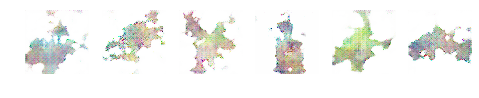

197 [D loss: 0.369337, acc.: 83.75%] [G loss: 1.355521]


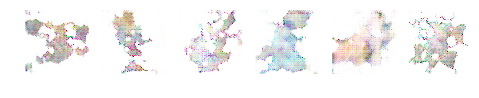

198 [D loss: 0.495667, acc.: 70.00%] [G loss: 1.960018]


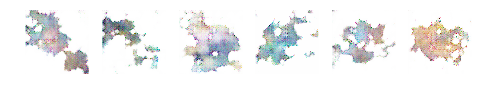

199 [D loss: 0.435805, acc.: 80.00%] [G loss: 1.692269]


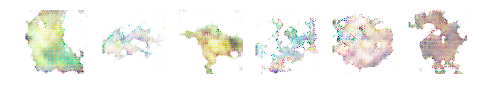

200 [D loss: 0.397551, acc.: 77.50%] [G loss: 1.485333]


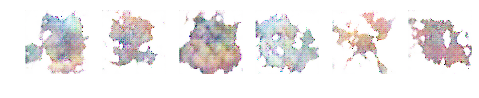

201 [D loss: 0.598555, acc.: 63.75%] [G loss: 1.876191]


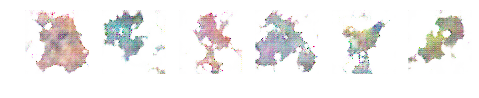

202 [D loss: 0.476591, acc.: 75.00%] [G loss: 1.525770]


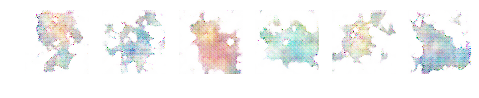

203 [D loss: 0.504760, acc.: 75.00%] [G loss: 1.825715]


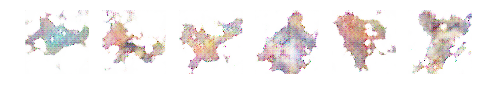

204 [D loss: 0.411674, acc.: 80.00%] [G loss: 1.549093]


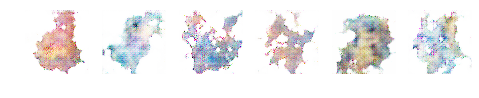

205 [D loss: 0.513098, acc.: 78.75%] [G loss: 1.915843]


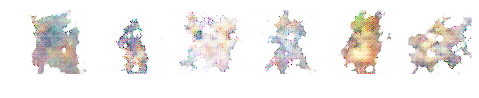

206 [D loss: 0.452754, acc.: 82.50%] [G loss: 1.455270]


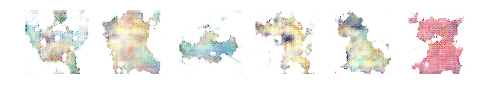

207 [D loss: 0.505536, acc.: 71.25%] [G loss: 1.965834]


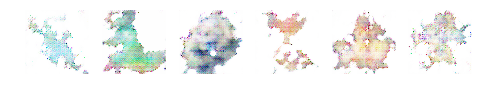

208 [D loss: 0.424805, acc.: 81.25%] [G loss: 1.640889]


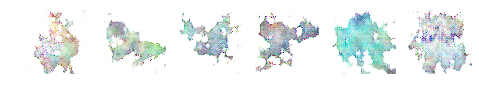

209 [D loss: 0.541106, acc.: 73.75%] [G loss: 1.876242]


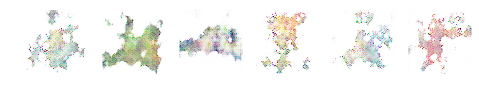

210 [D loss: 0.559325, acc.: 76.25%] [G loss: 1.049321]


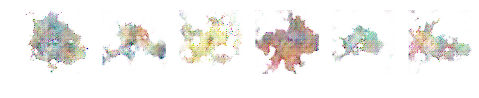

211 [D loss: 0.477871, acc.: 77.50%] [G loss: 1.403763]


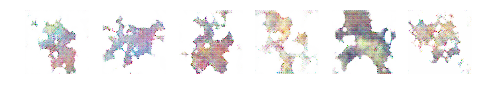

212 [D loss: 0.388159, acc.: 85.00%] [G loss: 1.454150]


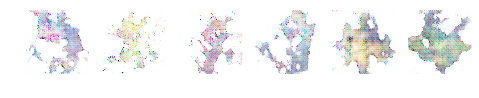

213 [D loss: 0.449279, acc.: 82.50%] [G loss: 1.936605]


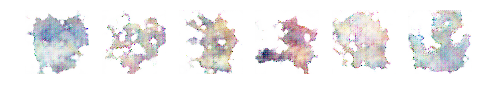

214 [D loss: 0.401455, acc.: 82.50%] [G loss: 1.781825]


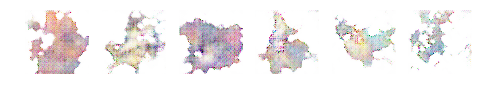

215 [D loss: 0.252039, acc.: 90.00%] [G loss: 1.654536]


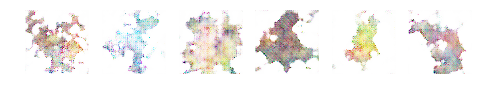

216 [D loss: 0.438128, acc.: 78.75%] [G loss: 2.160487]


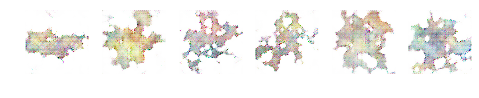

217 [D loss: 0.420459, acc.: 81.25%] [G loss: 2.198146]


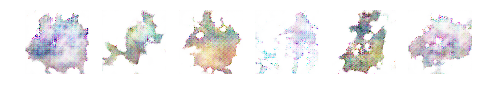

218 [D loss: 0.436787, acc.: 72.50%] [G loss: 2.028627]


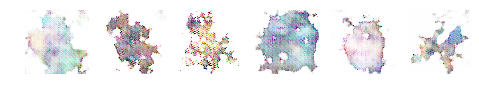

219 [D loss: 0.611755, acc.: 66.25%] [G loss: 1.483303]


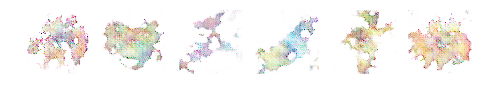

220 [D loss: 0.511045, acc.: 76.25%] [G loss: 1.412732]


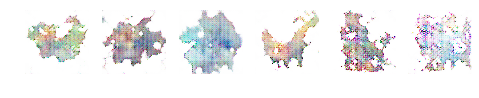

221 [D loss: 0.458175, acc.: 80.00%] [G loss: 1.523901]


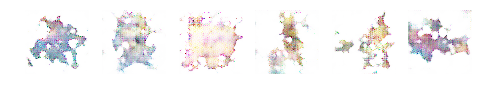

222 [D loss: 0.400874, acc.: 77.50%] [G loss: 1.333241]


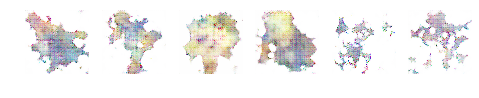

223 [D loss: 0.339284, acc.: 86.25%] [G loss: 1.594913]


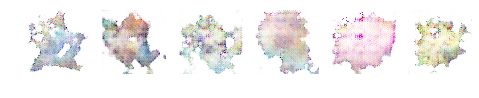

224 [D loss: 0.589394, acc.: 72.50%] [G loss: 1.586614]


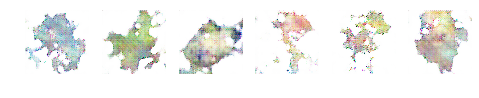

225 [D loss: 0.482439, acc.: 77.50%] [G loss: 1.738394]


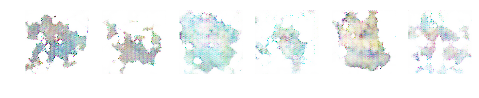

226 [D loss: 0.367232, acc.: 87.50%] [G loss: 1.759714]


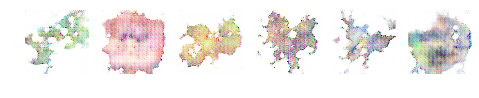

227 [D loss: 0.437477, acc.: 83.75%] [G loss: 1.890042]


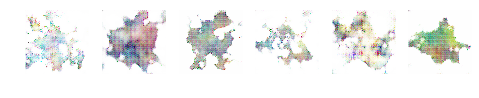

228 [D loss: 0.467915, acc.: 77.50%] [G loss: 1.713400]


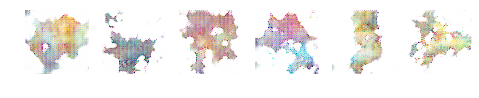

229 [D loss: 0.295372, acc.: 90.00%] [G loss: 2.335984]


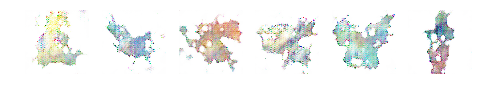

230 [D loss: 0.480539, acc.: 80.00%] [G loss: 1.862020]


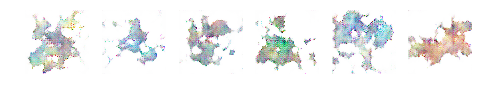

231 [D loss: 0.450075, acc.: 76.25%] [G loss: 1.656335]


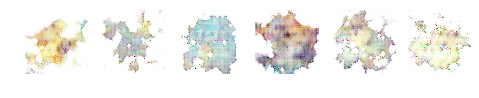

232 [D loss: 0.332249, acc.: 87.50%] [G loss: 1.565526]


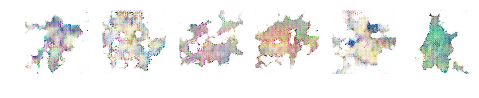

233 [D loss: 0.416593, acc.: 82.50%] [G loss: 1.497733]


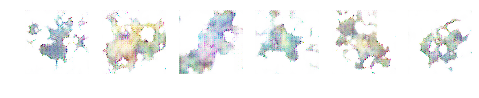

234 [D loss: 0.328589, acc.: 90.00%] [G loss: 2.000839]


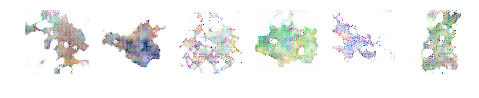

235 [D loss: 0.395511, acc.: 83.75%] [G loss: 1.842631]


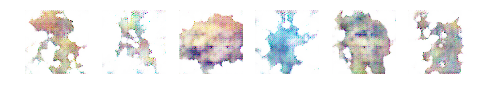

236 [D loss: 0.439923, acc.: 82.50%] [G loss: 1.713780]


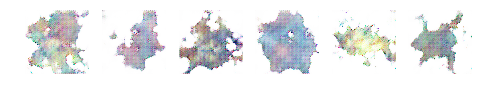

237 [D loss: 0.423553, acc.: 83.75%] [G loss: 1.816663]


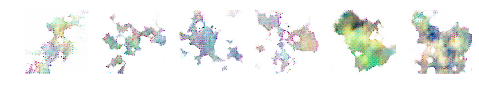

In [0]:
from keras.preprocessing import image
import datetime
import shutil

isExist = os.path.isdir('/samples')
if not isExist:
  os.makedirs('/samples')

today = datetime.datetime.today().strftime('%Y-%m-%d')
isExist = os.path.isdir('samples/%s' % today)
if not isExist:
  os.makedirs('samples/%s' % today)
else:
  shutil.rmtree('samples/%s' % today)
  os.makedirs('samples/%s' % today)
next = 1
epochs = 3000
for epoch in range(epochs):
#   d_loss = (0,0)
#   g_loss = 0
  for batch in range(int(len(images)/batch_size)):

    # ---------------------
    #  Train Discriminator
    # ---------------------
    
    indxs = np.random.randint(0, len(images),half_batch)
    imgs = images[indxs]
    
    noise = np.random.normal(0,1,(half_batch,100))
    generated = G.predict(noise)
    
    d_fake_loss = D.train_on_batch(imgs, np.ones((half_batch,1)))
    d_art_loss = D.train_on_batch(generated, np.zeros((half_batch,1)))
    d_loss = np.add(d_fake_loss,d_art_loss) * 0.5


    # ---------------------
    #  Train Generator
    # ---------------------
    
    g_loss_sum = 0
    for i in range(1):
      valid_y = np.ones((batch_size,1))
      noise = np.random.normal(0, 1, (batch_size, 100))
    
      g_loss_sum = g_loss_sum + GAN.train_on_batch(noise, valid_y)
    
    g_loss = g_loss_sum / 1
    if g_loss >= d_loss[0]:
      next = 2
    else:
      next = 1
    
  print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
  save_samples()
  show_samples(str(epoch))




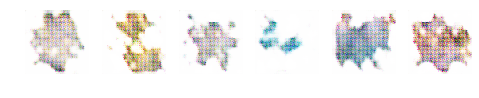

In [85]:
show_samples('3')